In [88]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
import datetime as dt
import plotly.express as px
import warnings
import time
warnings.filterwarnings('ignore')
from IPython.display import clear_output
import yfinance as yf
from scipy import stats

In [2]:
all_columns = ['Date','IBOV', 'DOLBRL', 'CDI', 'IBXX', 'SMLL']

bench = pd.read_csv('20230224_dao_benchmarks.csv')
bench = bench.rename({"Close|adj by CA's|orig currency|IBOV":"IBOV","Close|adj by CA's|orig currency|DOLOF":"DOLBRL", "Close|adj by CA's|orig currency|CDI Acumulado":"CDI", "Close|adj by CA's|orig currency|IBXX":"IBXX", "Close|adj by CA's|orig currency|SMLL":"SMLL"}, axis = 1)
bench = bench[all_columns].replace('-', np.NaN)
ibov = bench.dropna()
for c in all_columns[1:]:
    ibov[c] = pd.to_numeric(ibov[c])
ibov['ibov_variation'] = ibov['IBOV'].pct_change()

ibov['Date'] = pd.to_datetime(ibov['Date'])

di=pd.read_excel('taxas_b3.xlsx', usecols=['Data', 'Fator Diário'])

ibov = ibov.set_index('Date').join(di.set_index('Data')).dropna().reset_index().rename({'Fator Diário':'DI'}, axis=1)


# Define os símbolos e as datas de início e fim
indice_US = "^GSPC"  # S&P 500
start_date = ibov['Date'].iloc[0]
end_date = ibov['Date'].iloc[-1]

sp500_data = yf.download(indice_US, start=start_date, end=end_date)
sp500_data_df = pd.DataFrame({'IBOV_US': sp500_data['Adj Close']})

ibov = ibov.set_index('Date').join(sp500_data_df).dropna().reset_index()

ibov.head(10)

[*********************100%***********************]  1 of 1 completed


,Date,IBOV,DOLBRL,CDI,IBXX,SMLL,ibov_variation,DI,IBOV_US
0,2005-09-01,27962.0,2.3623,1389.55563,8914.0,515.43,-0.002924,1.000714,1221.589966
1,2005-09-02,28319.0,2.3429,1390.54844,8986.0,519.15,0.012767,1.000714,1218.020020
2,2005-09-06,28854.0,2.3262,1392.53574,9176.0,528.04,0.011640,1.000714,1233.390015
3,2005-09-08,28828.0,2.3198,1393.52929,9168.0,526.82,-0.000901,1.000713,1231.670044
4,2005-09-09,29307.0,2.3175,1394.52356,9338.0,537.65,0.016616,1.000713,1241.479980
5,2005-09-12,29086.0,2.3197,1395.51900,9312.0,534.97,-0.007541,1.000714,1240.560059
6,2005-09-13,28873.0,2.3269,1396.51468,9212.0,536.44,-0.007323,1.000713,1231.199951
7,2005-09-14,29049.0,2.3300,1397.51108,9266.0,540.86,0.006096,1.000713,1227.160034
8,2005-09-15,29366.0,2.3012,1398.49751,9360.0,545.13,0.010913,1.000706,1227.729980
9,2005-09-16,29815.0,2.2937,1399.48464,9500.0,551.65,0.015290,1.000706,1237.910034


In [3]:
init_date = pd.to_datetime('2010-1-1', format='%Y-%m-%d')
end_date = pd.to_datetime('2014-12-31', format='%Y-%m-%d')

ibov = ibov.loc[(ibov['Date']>=init_date)&(ibov['Date']<=end_date)]
ibov.head(10)

,Date,IBOV,DOLBRL,CDI,IBXX,SMLL,ibov_variation,DI,IBOV_US
1041,2010-01-04,70045.0,1.7240,2335.51812,22154.0,1182.0,0.021243,1.000328,1132.989990
1042,2010-01-05,70239.0,1.7227,2336.28372,22204.0,1179.0,0.002770,1.000328,1136.520020
1043,2010-01-06,70729.0,1.7337,2337.04956,22351.0,1192.0,0.006976,1.000328,1137.140015
1044,2010-01-07,70451.0,1.7413,2337.81651,22276.0,1188.0,-0.003930,1.000328,1141.689941
1045,2010-01-08,70262.0,1.7390,2338.58372,22226.0,1192.0,-0.002683,1.000328,1144.979980
1046,2010-01-11,70433.0,1.7323,2339.35117,22259.0,1202.0,0.002434,1.000328,1146.979980
1047,2010-01-12,70075.0,1.7439,2340.11887,22158.0,1201.0,-0.005083,1.000328,1136.219971
1048,2010-01-13,70385.0,1.7442,2340.88683,22236.0,1205.0,0.004424,1.000328,1145.680054
1049,2010-01-14,69801.0,1.7648,2341.65504,22046.0,1195.0,-0.008297,1.000328,1148.459961
1050,2010-01-15,68978.0,1.7711,2342.42265,21809.0,1184.0,-0.011791,1.000328,1136.030029


In [4]:
#2010 a 2014 - Dolar e bolsa
# pra cada interação, printar:
# peso*valor.mean() - força do sinal
# sharp do ibovespa no periodo
# sharp da estratégia
# retorno acumulado(np.cumprod 1+ serie) do ibovespa
# retorno acumulado(np.cumprod 1+ serie) da estratégia
# retorno acumulado do dólar
# printar os desvios padrões do ibovespa e da estratégia no período

#Olhar 2 últimas postagens com variáveis interessantes
# Agregado de empresas
# Bolsas internacionais - S&P e Nasdaq - yahoo finance python api


# Categorização
# Tipos de comportamento na bolsa
# Outro caminho:
    # Timing 
    


In [95]:
def summary_statistics(data):
    """
    Build some basic, pre-defined, statistic results for a series of values.
    """
    if isinstance(data, pd.DataFrame):
        cagrs = {}
        for col in data.columns:
            cagrs[col] = summary_statistics(data[col])
        return pd.DataFrame(cagrs.values(), cagrs.keys())
    assert pd.api.types.is_numeric_dtype(data), f"Expected numeric type. Received `{data.dtype}` dtype."
    res = data.agg(
        [
            np.amin,
            np.amax,
            np.median,
            np.mean,
            np.std,
            lambda x: x.skew(),
            lambda x: x.kurt(),
        ]
    )
    return pd.Series(res.values, ["amin", "amax", "median", "mean", "std", "skew", "kurt"])

# Estratégias
def estrategia_variacao(ser: pd.Series, peso) -> pd.Series:
    starting_pos = 1
    return starting_pos + peso*ser


# Sharp
def premio_risco(ser):
    return ser.mean()/ser.std()

def premio_risco_diversificado(ser, variacao_exp):
    coef_ret = variacao_exp ** 1.3
    coef_vol = variacao_exp ** 1.25
    return (ser.mean()*coef_ret)/(ser.std()*coef_vol)


In [6]:
ser = np.cumprod(1+ibov['IBOV_US'].head(10).pct_change(1)).dropna()
for var in range(1,10):
    print(premio_risco_diversificado(ser, var))
    print('\n')

222.96431898723125


230.82713871566057


235.55451398302083


238.96724018299145


241.64836921768833


243.86132597912479


245.74815750659184


247.3944017086288


248.85564340433652




In [96]:
window = 180 #dias, 12 meses
# window = 10

#pesquisa desde o começo até o day_referencce
def pesquisa_multipeso_multidia(variable_strategy, look_back, pesos):
    important_columns = ibov.loc[:,['Date', variable_strategy, 'ibov_variation', 'DI']]
    dic_day = {}
    i = 0
    for day in important_columns['Date'][window+1+2:]:
        print(f'Processando dia {day}')
        all_variable_series = important_columns.loc[important_columns['Date']<=day].tail(window+1+2)
        variable_series = all_variable_series.iloc[:-1]
#         print(variable_series)
        
#         pesos = [-3.0,-2.8,-2.6,-2.4,-2.2,-2,-1.8,-1.6,-1.4,-1.2,-1,-0.8,-0.6,-0.4,-0.2,0,0.2,0.4,0.6,0.8,1.0,1.2,1.4,1.6,1.8,2,2.2,2.4,2.6,2.8,3]
#         pesos = [-1]
#         pesos = [0, -1]

        
        melhor_premio = -99999999999
        melhor_exposition = 0
        melhor_peso = 0
        melhor_exposition_df = 0
        for peso in pesos:
#             print(f'Processando Peso {peso}')
            exposition_d_1, premio_risco_variavel = calcula_premio_risco_dia(variable_series, variable_strategy, estrategia_variacao, peso, look_back)
#             exposition_df, premio_risco_variavel = calcula_premio_risco_dia(variable_series, variable_strategy, estrategia_variacao, peso)
            
#             print(f'Peso: {peso}')
#             print(f'Exposição: {exposition_d_1}')
#             print(f'Sharp: {premio_risco_variavel}\n')


            if premio_risco_variavel > melhor_premio:
                melhor_exposition = exposition_d_1
                melhor_premio = premio_risco_variavel
                melhor_peso = peso

        ibov_variation_reference_day = all_variable_series.iloc[-1]['ibov_variation']

        dic_day[day] = [melhor_exposition, melhor_premio, melhor_peso, melhor_exposition*ibov_variation_reference_day]
#         clear_output(wait=True)
        
                #Debug
#         print(f'Sharp: {melhor_premio}')
#         print(f'Exposição: {melhor_exposition}')
# #         print(f'Peso: {melhor_peso}')

# #         if i == 800:
        if i == 0:

            break
        i+=1
    return dic_day, [important_columns[important_columns['Date'].isin(list(dic_day.keys()))], important_columns[important_columns['Date'].isin(list(dic_day.keys()))][variable_strategy].pct_change(look_back)]
             
            
            
            
#         best_peso_day = pesos[premios_riscos.index(max(premios_riscos))]
#     plt.plot(pesos, premios_riscos)
#     plt.title(f'{variable_strategy} {best_peso}')
#     plt.show()
#     return best_peso


# Gera comparação com o IBOV
def calcula_premio_risco_dia(variable_series, variable_strategy, estrategia, peso, look_back):
    #variable_series = ibov.loc[variable_strategy]
    #valores de D0 até D-1
    
    this_exposition = variable_series
#     print(this_exposition)
    
#     this_exposition[variable_strategy] = variable_series['Date']
#     this_exposition[variable_strategy] = variable_series[variable_strategy]

#     this_exposition[f'{variable_strategy}_variation'] = 1 - np.cumprod(1+this_exposition[variable_strategy].pct_change(look_back)) #mudar parametro retorno acumulado (não usar valores pertos tipo 31,32,33 mas sim 30,60,90,120 para dar informações diferentes)
    this_exposition[f'{variable_strategy}_variation'] = this_exposition[variable_strategy].pct_change(look_back)
    
#     print(this_exposition)
    slope, intercept, r, p, std_err = stats.linregress(this_exposition[f'{variable_strategy}_variation'].dropna(),this_exposition['ibov_variation'].iloc[1:])
    peso = slope
    print(peso)
    this_exposition[f'exposicao_variacao_{variable_strategy}'] = estrategia(this_exposition[f'{variable_strategy}_variation'], peso)

    #PERGUNTAR DO SHIFT
    this_exposition[f'exposicao_variacao_{variable_strategy}_shift'] = this_exposition[f'exposicao_variacao_{variable_strategy}'].shift(2)

    
    this_exposition[f'exposicao_variacao_{variable_strategy}_shift_difference'] = this_exposition[f'exposicao_variacao_{variable_strategy}_shift'] - 1
    
    this_exposition[f'pnl_variacao_{variable_strategy}'] = this_exposition['ibov_variation'] * this_exposition[f'exposicao_variacao_{variable_strategy}_shift']
    
    this_exposition.loc[this_exposition[f'exposicao_variacao_{variable_strategy}_shift_difference'] > 0, f'pnl_variacao_{variable_strategy}'] -= this_exposition['DI'] * this_exposition[f'exposicao_variacao_{variable_strategy}_shift_difference']
    this_exposition.loc[this_exposition[f'exposicao_variacao_{variable_strategy}_shift_difference'] < 0, f'pnl_variacao_{variable_strategy}'] += this_exposition['DI'] * this_exposition[f'exposicao_variacao_{variable_strategy}_shift_difference']

    
    print(pd.DataFrame({
        'Variavel':this_exposition[variable_strategy],
        'Sinal':this_exposition[f'{variable_strategy}_variation'],
        'Exp_pre_shift':this_exposition[f'exposicao_variacao_{variable_strategy}'],
        'Exp_pos_shift':this_exposition[f'exposicao_variacao_{variable_strategy}_shift'],
#         'Diferença':this_exposition[f'exposicao_variacao_{variable_strategy}_shift_difference'],
        'IBOV_Var':this_exposition['ibov_variation'],
#         'P&L_pre_DI':this_exposition[f'pnl_variacao_{variable_strategy}'],
        'P&L_pos_DI':this_exposition[f'pnl_variacao_{variable_strategy}']
    }))
    
#     plt.scatter(this_exposition[f'{variable_strategy}_variation'],this_exposition['ibov_variation'])
#     plt.show()
    
#     print('Exposição com shift:')
#     print(this_exposition[f'exposicao_variacao_{variable_strategy}_shift'])
#     print('Diferença da exposição:')
#     print(this_exposition[f'exposicao_variacao_{variable_strategy}_shift_difference'])
#     print('P&L antes de considerar DI:')
#     print(this_exposition[f'pnl_variacao_{variable_strategy}'])
#     print('P&L depois de considerar DI:')
#     print(this_exposition[f'pnl_variacao_{variable_strategy}'])

#     plt.plot(this_exposition['Date'], this_exposition[f'pnl_variacao_{variable_strategy}'])
#     plt.show()
    

#     var_exposicao = np.cumprod(1+this_exposition[f'exposicao_variacao_{variable_strategy}_shift'].dropna().pct_change()).iloc[-1].item()
    premio_risco_variavel = premio_risco(this_exposition[f'pnl_variacao_{variable_strategy}'])
#     premio_risco_variavel = premio_risco_diversificado(this_exposition[f'pnl_variacao_{variable_strategy}'], var_exposicao)

#     return this_exposition, premio_risco_variavel
    
    return this_exposition[f'exposicao_variacao_{variable_strategy}_shift'].iloc[-1], premio_risco_variavel
    


def gera_graficos(variable_strategy, look_back, pesos):
    dic_day, var_variacao = pesquisa_multipeso_multidia(variable_strategy, look_back, pesos)
#     print(var_variacao[0])
#     print(var_variacao[1])

#     print(dic_day)
    df_resumo = pd.DataFrame.from_dict(dic_day, orient='index', columns = ['Exposição', 'Sharp', 'Peso', 'Atribuição_Estratégia'])
    figure, axis = plt.subplots(3, 1)
    figure.set_figwidth(10)
    figure.set_figheight(20)

#     figure.suptitle(f'Lookback de variação: {look_back}', fontsize=16)

    axis[0].plot(df_resumo.index, df_resumo['Sharp'])
    axis[0].set_title("Sharp no Tempo")
#     print('Peso')
#     print(df_resumo['Peso'])
    axis[1].plot(df_resumo.index, df_resumo['Peso'])
    axis[1].set_title("Peso no Tempo")
#     print('Exposição')
#     print(df_resumo['Exposição'])
    axis[2].plot(var_variacao[0]['Date'], var_variacao[1], color='blue')
    axis[2].set_ylabel("Sinal",color="blue",fontsize=14)
    axis2=axis[2].twinx()
    axis2.plot(df_resumo.index, df_resumo['Exposição'], color='red')
    axis2.set_ylabel("Exposição",color="red",fontsize=14)
    axis2.set_title("Exposição e Sinal no Tempo")
    
    plt.show()
    
    premio_risco_variavel = premio_risco(df_resumo[f'Atribuição_Estratégia'])
    
    compare_df = ibov[['IBOV','Date']].set_index('Date').join(np.cumprod(1+df_resumo['Atribuição_Estratégia'])).dropna()

    compare_df['IBOV'] = pd.to_numeric(compare_df['IBOV'])
    compare_df['IBOV'] /= compare_df['IBOV'].iloc[0]
    compare_df[f'Atribuição_Estratégia'] /= compare_df[f'Atribuição_Estratégia'].iloc[0]
#     compare_df['pnl_70%'] /= compare_df['pnl_70%'].iloc[0]
    return premio_risco_variavel, compare_df


In [97]:
start_time = time.time()

pesos = [0]

dic_day, var_variacao = pesquisa_multipeso_multidia('IBOV_US', 1, pesos)
# px.line(compare_df, log_y=True, title = "Performance Variação Câmbio x IBOV {:.4f}".format(premio_risco_variavel))

print(f'{(time.time() - start_time)/60} minutos')

Processando dia 2010-10-04 00:00:00
0.8298301668843103
         Variavel     Sinal  Exp_pre_shift  Exp_pos_shift  IBOV_Var  \
1042  1136.520020       NaN            NaN            NaN  0.002770   
1043  1137.140015  0.000546       1.000453            NaN  0.006976   
1044  1141.689941  0.004001       1.003320            NaN -0.003930   
1045  1144.979980  0.002882       1.002391       1.000453 -0.002683   
1046  1146.979980  0.001747       1.001450       1.003320  0.002434   
...           ...       ...            ...            ...       ...   
1219  1142.160034 -0.005667       0.995297       0.993086  0.009077   
1220  1147.699951  0.004850       1.004025       1.017588  0.005987   
1221  1144.729980 -0.002588       0.997853       0.995297  0.000014   
1222  1141.199951 -0.003084       0.997441       1.004025  0.002903   
1223  1146.239990  0.004416       1.003665       0.997853  0.011523   

      P&L_pos_DI  
1042         NaN  
1043         NaN  
1044         NaN  
1045   -0.003137

Processando dia 2010-10-04 00:00:00
         Variavel     Sinal  Exp_pre_shift  Exp_pos_shift  IBOV_Var  \
1042  1136.520020       NaN            NaN            NaN  0.002770   
1043  1137.140015  0.000546       1.000546            NaN  0.006976   
1044  1141.689941  0.004001       1.004001            NaN -0.003930   
1045  1144.979980  0.002882       1.002882       1.000546 -0.002683   
1046  1146.979980  0.001747       1.001747       1.004001  0.002434   
...           ...       ...            ...            ...       ...   
1219  1142.160034 -0.005667       0.994333       0.991669  0.009077   
1220  1147.699951  0.004850       1.004850       1.021194  0.005987   
1221  1144.729980 -0.002588       0.997412       0.994333  0.000014   
1222  1141.199951 -0.003084       0.996916       1.004850  0.002903   
1223  1146.239990  0.004416       1.004416       0.997412  0.011523   

      P&L_pos_DI  
1042         NaN  
1043         NaN  
1044         NaN  
1045   -0.003230  
1046   -0.001559

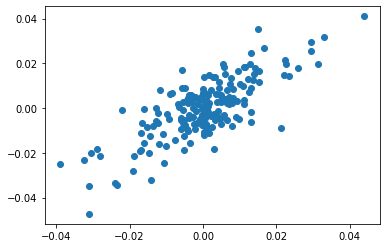

0.002731800079345703 minutos


In [85]:
start_time = time.time()

pesos = [-1]

dic_day, var_variacao = pesquisa_multipeso_multidia('IBOV_US', 1, pesos)
# px.line(compare_df, log_y=True, title = "Performance Variação Câmbio x IBOV {:.4f}".format(premio_risco_variavel))

print(f'{(time.time() - start_time)/60} minutos')

### S%P 500 retorno acumulado com peso variável

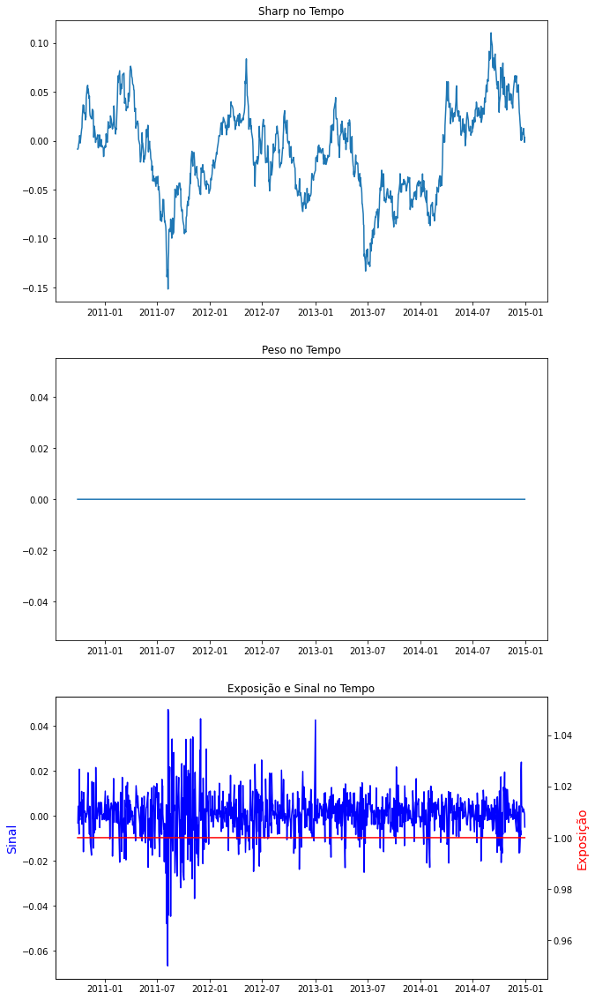

4.073827556769053 minutos


In [116]:
start_time = time.time()

premio_risco_variavel, compare_df = gera_graficos('IBOV_US', 1)
px.line(compare_df, log_y=True, title = "Performance Variação Câmbio x IBOV {:.4f}".format(premio_risco_variavel))

print(f'{(time.time() - start_time)/60} minutos')

### Câmbio retorno acumulado com peso variável

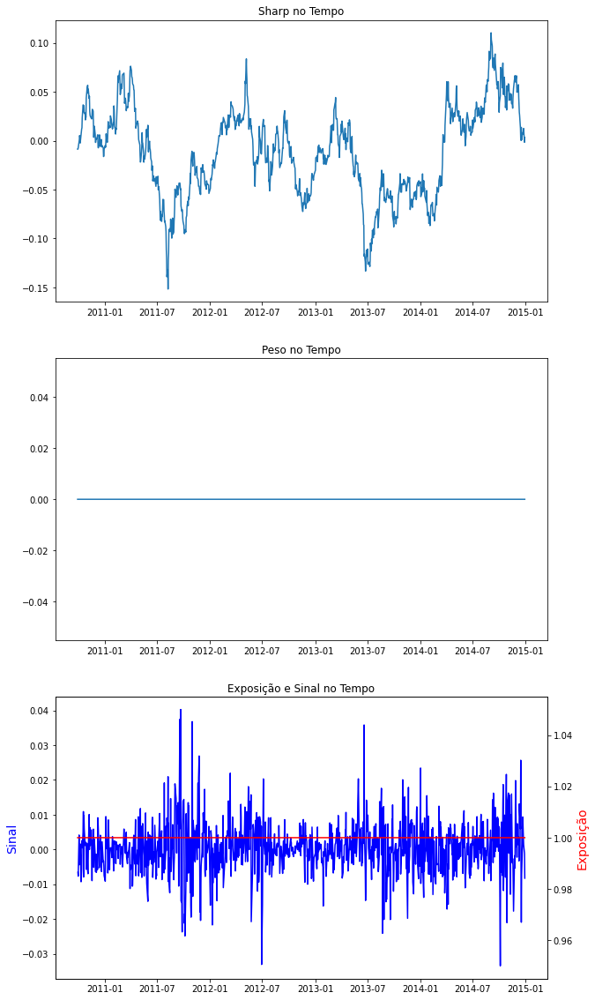

3.9263180176417034 minutos


In [117]:
start_time = time.time()

premio_risco_variavel, compare_df = gera_graficos('DOLBRL', 1)
px.line(compare_df, log_y=True, title = "Performance Variação Câmbio x IBOV {:.4f}".format(premio_risco_variavel))

print(f'{(time.time() - start_time)/60} minutos')

### S%P 500 retorno acumulado com peso único

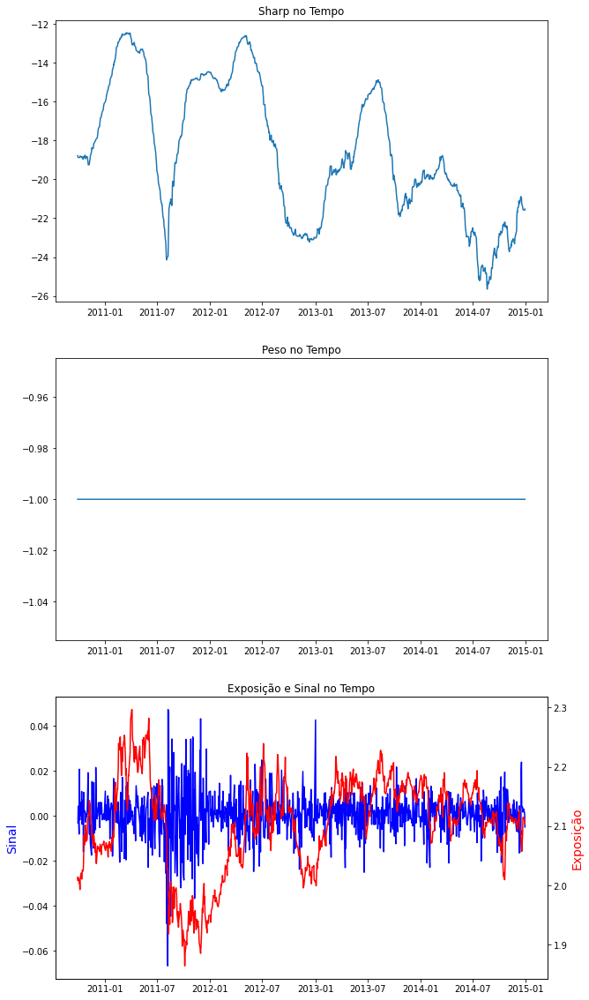

0.27017283042271933 minutos


In [121]:
start_time = time.time()

premio_risco_variavel, compare_df = gera_graficos('IBOV_US', 1)
px.line(compare_df, log_y=True, title = "Performance Variação Câmbio x IBOV {:.4f}".format(premio_risco_variavel))

print(f'{(time.time() - start_time)/60} minutos')

### Câmbio retorno acumulado com peso único

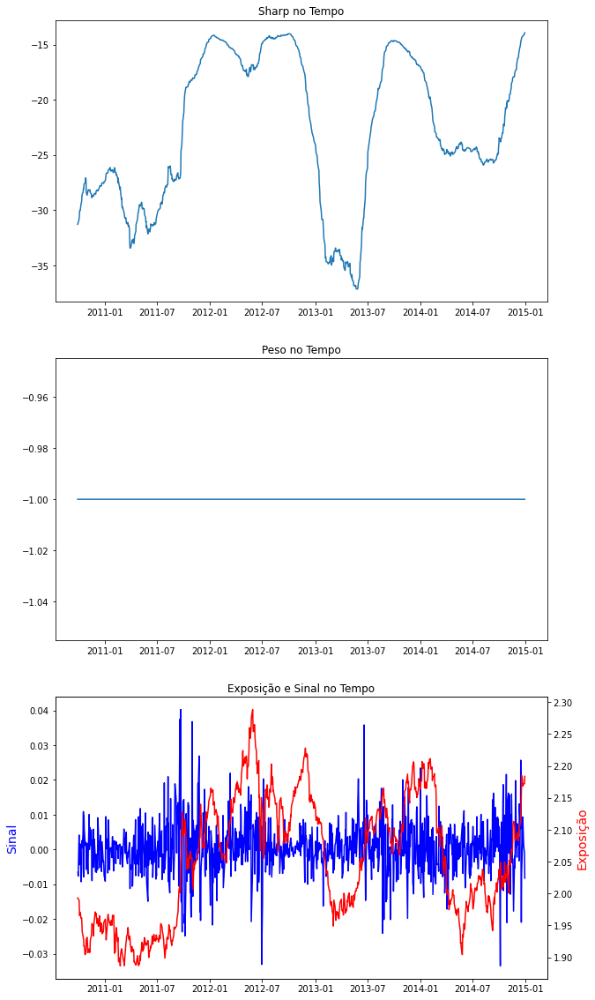

0.2165114720662435 minutos


In [122]:
start_time = time.time()

premio_risco_variavel, compare_df = gera_graficos('DOLBRL', 1)
px.line(compare_df, log_y=True, title = "Performance Variação Câmbio x IBOV {:.4f}".format(premio_risco_variavel))

print(f'{(time.time() - start_time)/60} minutos')

In [ ]:
start_time = time.time()
# look_backs = [1, 30, 60, 90, 120]
look_backs = [1]

for lb in look_backs:
    premio_risco_variavel, compare_df = gera_graficos('DOLBRL', lb)
    px.line(compare_df, log_y=True, title = "Performance Variação Câmbio x IBOV {:.4f}".format(premio_risco_variavel))
    
print(f'{(time.time() - start_time)/60} minutos')

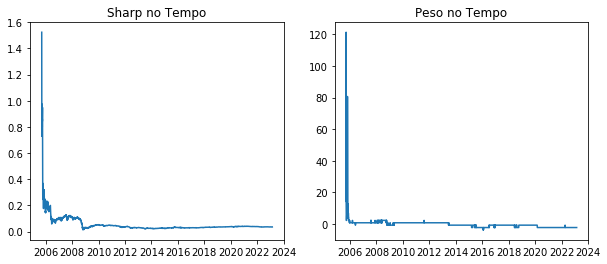

80.59865316152573 minutos


In [13]:
start_time = time.time()
look_backs = [1, 30, 60, 90, 120]
for lb in look_backs:
    premio_risco_variavel, compare_df = gera_graficos('DOLBRL', lb)
    px.line(compare_df, log_y=True, title = "Performance Variação Câmbio x IBOV {:.4f}".format(premio_risco_variavel))
    
print(f'{(time.time() - start_time)/60} minutos')

## Variação do Câmbio

In [7]:
premio_risco_variavel, compare_df = gera_grafico_unico('DOLBRL',estrategia_variacao, 26)
px.line(compare_df, log_y=True, title = "Performance Variação Câmbio x IBOV {:.4f}".format(premio_risco_variavel))

## Variação do CDI

In [8]:
premio_risco_variavel, compare_df = gera_grafico_unico('CDI',estrategia_variacao, -614)
px.line(compare_df, log_y=True, title = "Performance Variação CDI x IBOV {:.4f}".format(premio_risco_variavel))

## Variação do IBXX

In [9]:
premio_risco_variavel, compare_df = gera_grafico_unico('IBXX',estrategia_variacao, -3)
px.line(compare_df, log_y=True, title = "Performance Variação IBXX x IBOV {:.4f}".format(premio_risco_variavel))

## Variação do SMLL

In [10]:
premio_risco_variavel, compare_df = gera_grafico_unico('SMLL',estrategia_variacao, -8)
px.line(compare_df, log_y=True, title = "Performance Variação SMLL x IBOV {:.4f}".format(premio_risco_variavel))

In [ ]:
def estrategia_variacao_multilabel(lista_series, lista_pesos):
    starting_pos = 1
    
    for i in range(len(lista_series)):
        starting_pos -= lista_pesos[i]*lista_series[i]
        
    return starting_pos

def gera_grafico_multilabel(variable_strategies, estrategia, lista_pesos):
    lista_series = []
    for variable_strategy in variable_strategies:
        ibov[f'{variable_strategy}_variation'] = ibov[variable_strategy].pct_change()
        lista_series.append(ibov[f'{variable_strategy}_variation'])
    ibov['exposicao_variacao_multilabel'] = estrategia(lista_series, lista_pesos)
    ibov['exposicao_variacao_multilabel_shift'] = ibov['exposicao_variacao_multilabel'].shift(2)
    ibov['pnl_variacao_multilabel'] = ibov['ibov_variation'] * ibov['exposicao_variacao_multilabel_shift']
    ibov['pnl_70%'] = ibov['ibov_variation'] * 0.7
    
    premio_risco_variavel = premio_risco(ibov['pnl_variacao_multilabel'])
    
    compare_df = bench[['IBOV','Date']].join([np.cumprod(1+ibov[f'pnl_variacao_multilabel']), np.cumprod(1+ibov['pnl_70%'])]).dropna()    
    compare_df['IBOV'] = pd.to_numeric(compare_df['IBOV'])
    compare_df['IBOV'] /= compare_df['IBOV'].iloc[0]
    compare_df['pnl_variacao_multilabel'] /= compare_df['pnl_variacao_multilabel'].iloc[0]
    compare_df['pnl_70%'] /= compare_df['pnl_70%'].iloc[0]
    
    return premio_risco_variavel, compare_df.set_index('Date')


In [ ]:
premio_risco_variavel, compare_df = gera_grafico_multilabel(['DOLBRL', 'CDI', 'IBXX', 'SMLL'], estrategia_variacao_multilabel, [26, -614, -3, -8])
px.line(compare_df, log_y=True, title = "Performance Variação Multilabel {:.4f}".format(premio_risco_variavel))


| Estratégia    | Prêmio-Risco|
| ----------- | ----------- |
| Variação do Câmbio      | 0.0299       |
| Variação Multilabel   | 0.0287        |
| Variação do SMLL   | 0.0279        |
| Variação do IBXX   | 0.0266        |
| Variação do CDI   | 0.0265        |




A partir da medida resumo adotada, incluir outras variáveis a Câmbio na verdade está atrapalhando a análise.

Utilizar outras estratégias, que não sejam variação diária, para explicar a exposição para essas outras 3 variáveis.

In [ ]:
#testar o proprio ibovespa
#combinação linear das variáveis
#custo de operacao
#taxas de administração

In [51]:
pesos = np.arange(-3, 3, 0.2)
for peso in pesos:
    print(peso)

-3.0
-2.8
-2.5999999999999996
-2.3999999999999995
-2.1999999999999993
-1.9999999999999991
-1.799999999999999
-1.5999999999999988
-1.3999999999999986
-1.1999999999999984
-0.9999999999999982
-0.799999999999998
-0.5999999999999979
-0.3999999999999977
-0.1999999999999975
2.6645352591003757e-15
0.20000000000000284
0.400000000000003
0.6000000000000032
0.8000000000000034
1.0000000000000036
1.2000000000000037
1.400000000000004
1.600000000000004
1.8000000000000043
2.0000000000000044
2.2000000000000046
2.400000000000005
2.600000000000005
2.800000000000005
